In [4]:
import os
from IPython.display import display
import pandas as pd
from scipy import stats
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.cluster import KMeans
from ydata_profiling import ProfileReport
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.feature_selection import RFE, VarianceThreshold
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from imblearn.over_sampling import SMOTE
%matplotlib inline

In [5]:
# df = load_data(file_path='../data/dataset.csv')
PATH = os.getcwd()
df = pd.read_csv(os.path.join(PATH, "data/enriched_synthetic_data.csv"))
# df.drop(["music_id"], axis=1, inplace=True)
df.head()

,user_id,age,education,gender,country,music,artist_name,featured_artists,genre,plays,...,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit
0,83811,16,Undergraduate,F,Urban,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,...,-8.228000,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,2017-09-23,True
1,83811,16,Undergraduate,F,Urban,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",NaN,686,...,-7.879000,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,2013-04-12,False
2,13397,17,Middle School,M,Non-Urban,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",NaN,136,...,-7.344833,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,2009-02-03,False
3,70645,44,Graduate,M,Non-Urban,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,...,-7.606000,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,2017-01-01,False
4,70645,44,Graduate,M,Non-Urban,Dreams,Campsite Dream,NaN,Country,391,...,-9.894632,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,1974,False


In [6]:
# drop unused columns
df.drop(["education", "country"], axis=1, inplace=True)

In [7]:
print(df.shape)  # prints the dimensions of the DataFrame

(19974, 25)


In [8]:
scaler = MinMaxScaler(feature_range=(1, 5))
df["rating"] = scaler.fit_transform(df[["plays"]]).round().astype(int)

In [9]:
df.head()

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit,rating
0,83811,16,F,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,3.67,2fQrGHiQOvpL9UgPvtYy6G,...,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,2017-09-23,True,1
1,83811,16,F,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",NaN,686,4.44,2ihCaVdNZmnHZWt0fvAM7B,...,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,2013-04-12,False,2
2,13397,17,M,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",NaN,136,2.83,46jLy47W8rkf8rEX04gMKB,...,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,2009-02-03,False,1
3,70645,44,M,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,5.14,5oVlbbiKGdGeZkWCFy0mqk,...,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,2017-01-01,False,1
4,70645,44,M,Dreams,Campsite Dream,NaN,Country,391,3.20,1SNoSoQ3JZldOhzBY9gw0n,...,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,1974,False,2


In [10]:
# Define presets for data visualization
def presets():
    plt.rc('figure', autolayout = True)

    plt.rc('axes', 
        labelsize = 'large',
        labelweight = 'bold',
        titlesize = 14,
        titleweight = 'bold',
        titlepad = 10       
    )

    %config InlineBackend.figure_format = 'retina'
    pd.options.display.max_rows = 10
    sns.set_style('darkgrid')
    # Set preset for darkmode for matplotlib and seaborn visualizations
    plt.style.use('dark_background')

    warnings.filterwarnings(action = 'ignore', category = UserWarning)
    return 

presets()



In [11]:
df.info(memory_usage="deep")  # prints the memory usage of the DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19974 entries, 0 to 19973
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   user_id           19974 non-null  int64  
 1   age               19974 non-null  int64  
 2   gender            19974 non-null  object 
 3   music             19974 non-null  object 
 4   artist_name       19974 non-null  object 
 5   featured_artists  9618 non-null   object 
 6   genre             17450 non-null  object 
 7   plays             19974 non-null  int64  
 8   duration          19974 non-null  float64
 9   music_id          19974 non-null  object 
 10  id_artists        19974 non-null  object 
 11  acousticness      19974 non-null  float64
 12  danceability      19974 non-null  float64
 13  energy            19974 non-null  float64
 14  key               19974 non-null  int64  
 15  loudness          19974 non-null  float64
 16  mode              19974 non-null  int64 

In [12]:
df["release_date"].value_counts()

release_date
1996          183
2000          181
1972          172
1997          166
1995          165
             ... 
1998-05-01      1
2007-11-08      1
2012-05-19      1
2011-12-27      1
2017-03-22      1
Name: count, Length: 3402, dtype: int64

In [13]:
# df.shape
df.describe(include="all")  # prints the summary statistics of the DataFrame

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit,rating
count,19974.000000,19974.000000,19974,19974,19974,9618,17450,19974.000000,19974.00000,19974,...,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974,19974,19974.000000
unique,NaN,NaN,2,9470,5085,8585,38,NaN,NaN,11528,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3402,2,NaN
top,NaN,NaN,M,Closer,Drake,Miracle Tones,Classical,NaN,NaN,7BKLCZ1jbUBVqRi2FVlTVw,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1996,False,NaN
freq,NaN,NaN,10000,49,271,7,1479,NaN,NaN,33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,183,18710,NaN
mean,49680.999149,35.925253,NaN,NaN,NaN,NaN,NaN,384.862972,3.87686,NaN,...,0.729749,0.085706,0.156571,0.186839,0.477929,121.014846,3.944878,NaN,NaN,1.490388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
min,4.000000,13.000000,NaN,NaN,NaN,NaN,NaN,1.000000,0.00000,NaN,...,0.000000,0.000000,0.000000,0.009360,0.000000,0.000000,0.000000,NaN,NaN,1.000000
25%,24543.250000,18.000000,NaN,NaN,NaN,NaN,NaN,1.000000,3.33000,NaN,...,0.000000,0.043182,0.000445,0.126085,0.367500,111.692446,4.000000,NaN,NaN,1.000000
50%,49514.000000,30.000000,NaN,NaN,NaN,NaN,NaN,225.000000,3.75000,NaN,...,1.000000,0.063075,0.100860,0.170092,0.464207,120.628039,4.000000,NaN,NaN,1.000000
75%,74545.750000,52.000000,NaN,NaN,NaN,NaN,NaN,660.000000,4.28000,NaN,...,1.000000,0.096595,0.229892,0.215405,0.579846,129.374425,4.000000,NaN,NaN,2.000000


In [14]:
# profile = ProfileReport(
#     df, title="EDA Report", explorative=True
# )  # generates a profile report of the DataFrame

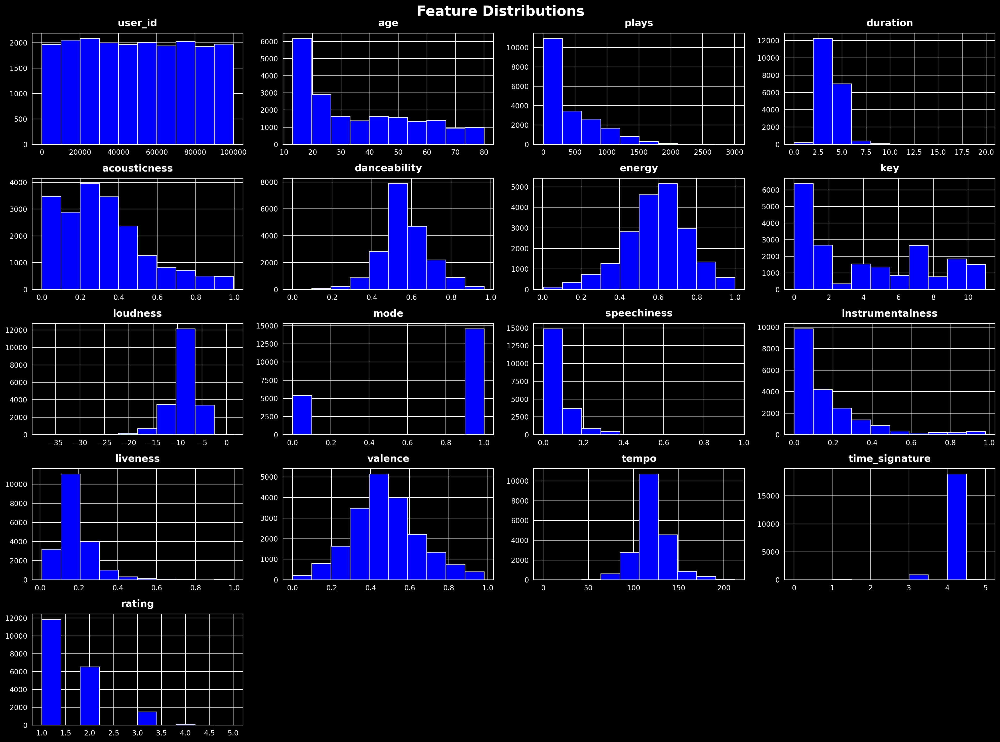

In [15]:
# Plot histograms with sky blue color
supt_presets = dict(fontsize=20, fontweight="bold")

df.hist(figsize=(20, 15), color="blue")
plt.suptitle("Feature Distributions", **supt_presets)
plt.show()  # plots the histograms of the DataFrame with sky blue color

In [16]:
def check_missing_value():
    # show number of missing values as a dataframe by column
    missing_values = df.isnull().sum()
    missing_values = missing_values[missing_values > 0]
    missing_values = missing_values.sort_values(ascending=False)
    missing_values = missing_values.reset_index()
    missing_values.columns = ["Feature", "Missing Values"]
    return missing_values


check_missing_value()

,Feature,Missing Values
0,featured_artists,10356
1,genre,2524


In [17]:
# Fill featured_artists missing values with "Unknown"
df["featured_artists"].fillna("None", inplace=True)

/tmp/ipykernel_782/327049541.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["featured_artists"].fillna("None", inplace=True)


In [18]:
# Fill genre missing values with "Unknown"
df["genre"] = df["genre"].fillna("Unknown")

In [19]:
check_missing_value()

,Feature,Missing Values


In [20]:
df.select_dtypes(
    include=["category", "object"]
).columns.tolist()  # prints the columns with categorical data

['gender',
 'music',
 'artist_name',
 'featured_artists',
 'genre',
 'music_id',
 'id_artists',
 'release_date']

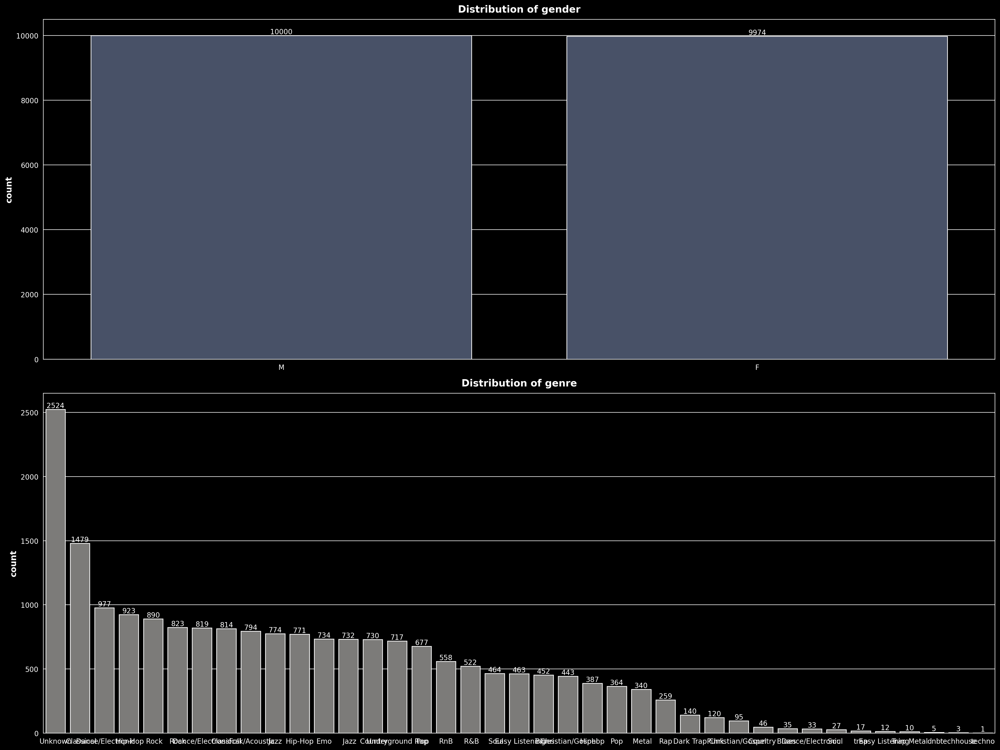

In [21]:
# distribution of categorical columns
cat_cols = ["gender", "genre", "explicit"]
fig, axes = plt.subplots(2, 1, figsize=(20, 15))
cc = sns.color_palette(n_colors=len(cat_cols), palette="cividis")

for i, ax in enumerate(axes.flatten()):
    # Count the occurrences of each category
    count_data = df[cat_cols[i]].value_counts().sort_values(ascending=False)
    sns.countplot(x=cat_cols[i], data=df, order=count_data.index, ax=ax, color=cc[i])
    ax.set(xlabel="", title=f"Distribution of {cat_cols[i]}")
    ax.bar_label(ax.containers[0], fmt="%.0f")
plt.show()

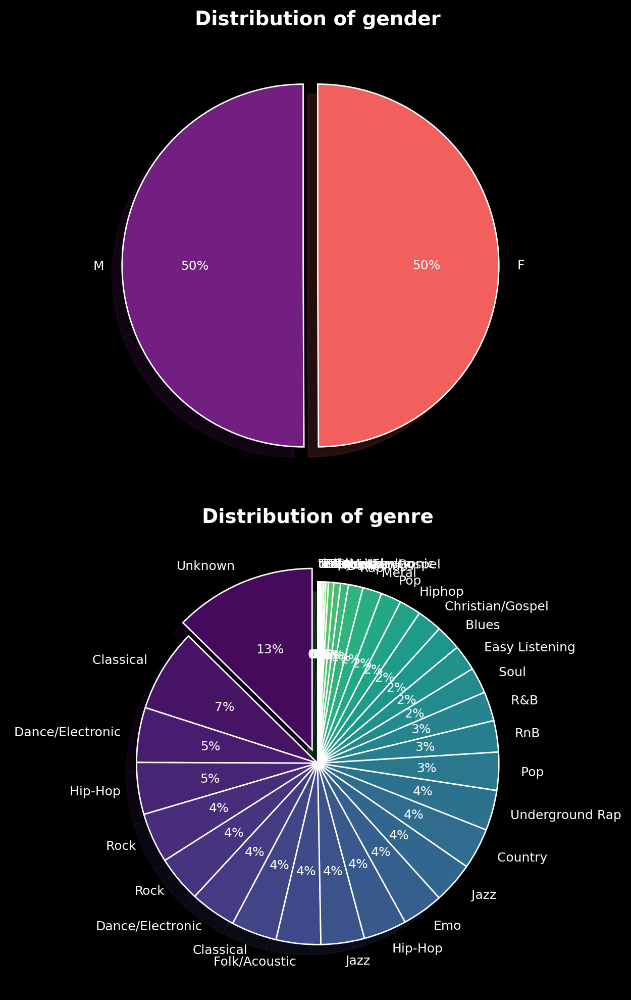

In [22]:
cat_cols = ["gender", "genre", "explicit"]
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
cc = ["magma", "viridis", "cividis", "magma"]

for i, ax in enumerate(axes.flatten()):
    # Count the occurrences of each category
    count_data = df[cat_cols[i]].value_counts().sort_values(ascending=False)
    # Create pie chart
    n = count_data.shape[0]
    wedges, texts, autotexts = ax.pie(
        count_data,
        labels=count_data.index,
        autopct="%.0f%%",
        colors=sns.color_palette(n_colors=n, palette=cc[i]),
        startangle=90,
        textprops={"fontsize": 9},
        explode=[0.08] + [0] * (n - 1),
        shadow=True,
    )
    ax.set(title=f"Distribution of {cat_cols[i]}")

plt.tight_layout()
plt.show()  # plots the distribution of categorical columns

## Fixing Data Quality Issues With Genre

In [23]:
df["genre"].unique()

array(['Dark Trap', 'Unknown', ' Pop', ' Country', 'Classical', 'Rock',
       'Hiphop', ' Soul  ', 'Dance/Electronic', 'Jazz', ' Soul',
       ' Classical', ' Christian/Gospel', ' Dance/Electronic', 'Hip-Hop',
       ' Hip-Hop', 'Underground Rap', ' Jazz', ' Rock', ' Folk/Acoustic',
       ' Country  ', ' Easy Listening', 'Emo', ' Metal', ' R&B', 'Rap',
       ' Christian/Gospel  ', 'RnB', ' Blues', 'Pop', ' Punk',
       ' Dance/Electronic  ', 'Trap Metal', 'trap', ' Easy Listening  ',
       ' Blues  ', 'dnb', 'techhouse', 'techno'], dtype=object)

In [24]:
# Strip leading and trailing whitespace from the genre column
df["genre"] = df["genre"].str.strip()

# Define the mapping for similar genres
genre_mapping = {
    " Pop": "Pop",
    " Country": "Country",
    " Classical": "Classical",
    " Christian/Gospel": "Christian/Gospel",
    " Dance/Electronic": "Dance/Electronic",
    " Hip-Hop": "Hip-Hop",
    "Hiphop": "Hip-Hop",
    " Jazz": "Jazz",
    " Rock": "Rock",
    " Soul": "Soul",
    " Country  ": "Country",
    " Christian/Gospel  ": "Christian/Gospel",
    "R&B": "RnB",
    "RnB": "RnB",
}

# Apply the mapping to the genre column
df["genre"] = df["genre"].replace(genre_mapping)

# Verify the cleaned genres
unique_genres = df["genre"].unique()
print(unique_genres)

['Dark Trap' 'Unknown' 'Pop' 'Country' 'Classical' 'Rock' 'Hip-Hop' 'Soul'
 'Dance/Electronic' 'Jazz' 'Christian/Gospel' 'Underground Rap'
 'Folk/Acoustic' 'Easy Listening' 'Emo' 'Metal' 'RnB' 'Rap' 'Blues' 'Punk'
 'Trap Metal' 'trap' 'dnb' 'techhouse' 'techno']


In [25]:
# If genre value counts less than 100, replace with "Other"
genre_counts = df["genre"].value_counts()
other_genres = genre_counts[genre_counts < 100].index
df["genre"] = df["genre"].replace(other_genres, "Other")

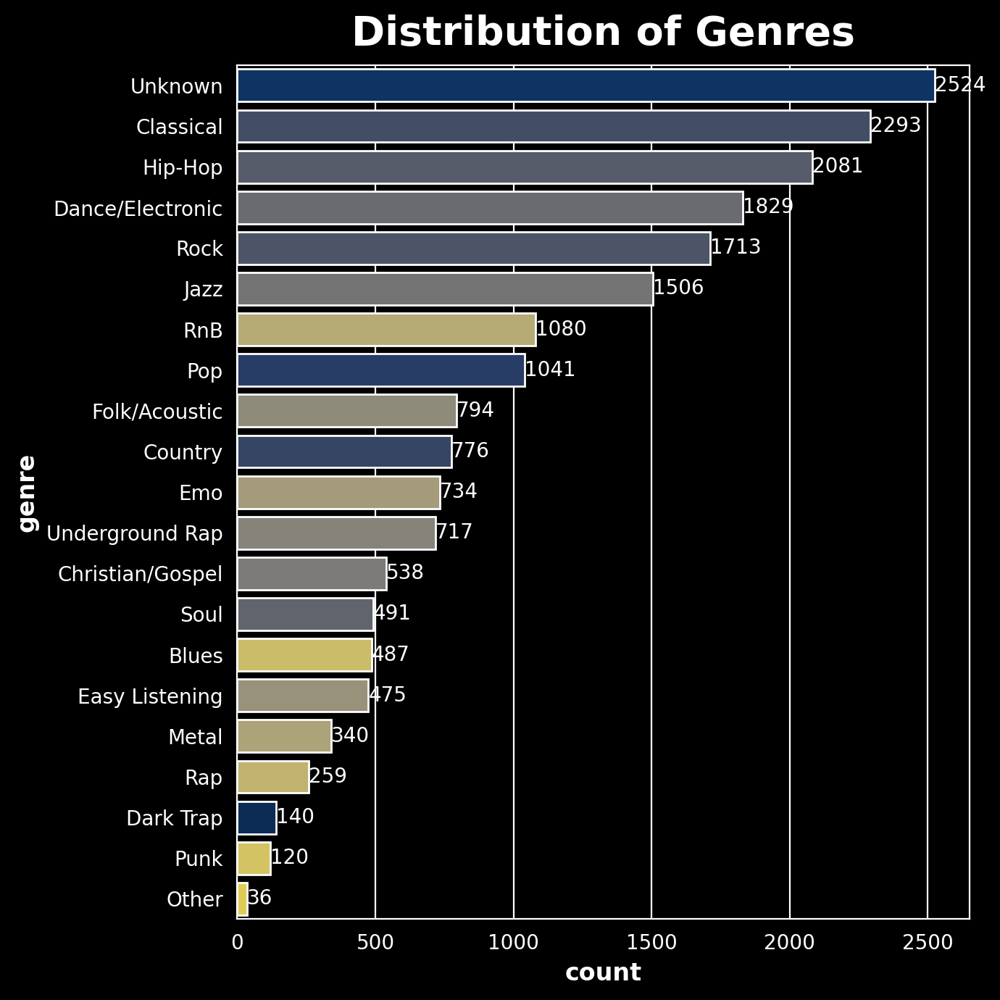

In [26]:
count_order = df["genre"].value_counts().sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(7, 7))
sns.countplot(
    df,
    y="genre",
    hue="genre",
    order=count_order.index,
    ax=ax,
    palette="cividis",
    legend=False,
)
ax.set_title("Distribution of Genres", **supt_presets)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")  # plots the distribution of genres

In [27]:
# profile.to_notebook_iframe()  # displays the profile report in the Jupyter notebook

In [28]:
#

## Analysis of Song Names

---


In [29]:
from wordcloud import WordCloud
from collections import Counter
import nltk
from nltk.corpus import stopwords
import string

df_ = df.copy()
# Text Preprocessing
# nltk.download("stopwords")
stop_words = set(stopwords.words("english"))

In [30]:
def preprocess_text(text):
    # Remove punctuation
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Convert to lowercase
    text = text.lower()
    # Remove stopwords
    text = " ".join(word for word in text.split() if word not in stop_words)
    return text


df_["cleaned_music"] = df_["music"].apply(preprocess_text)

# Word Frequency Analysis
all_words = " ".join(df_["cleaned_music"]).split()
word_freq = Counter(all_words)

In [31]:
display(df_["cleaned_music"].head(20))

0      bank account
1      little talks
2       wherever go
3       new friends
4            dreams
          ...      
15           upside
16             love
17         practice
18    crooked teeth
19     livin prayer
Name: cleaned_music, Length: 20, dtype: object

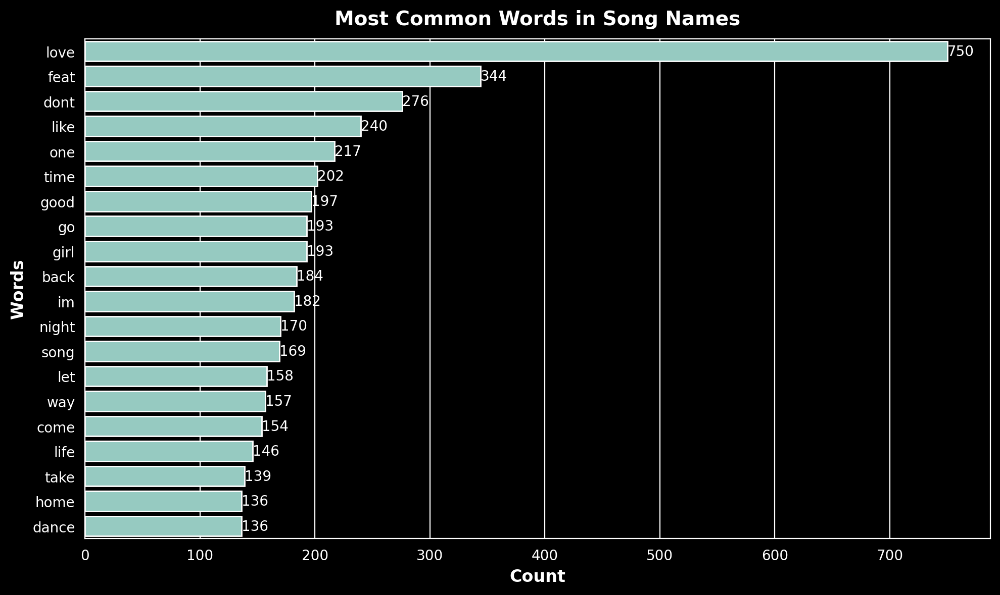

In [32]:
most_common_words = word_freq.most_common(20)

# Plotting Most Common Words
words, counts = zip(*most_common_words)
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=list(counts), y=list(words), ax=ax)
plt.title("Most Common Words in Song Names")
plt.xlabel("Count")
plt.ylabel("Words")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.show()

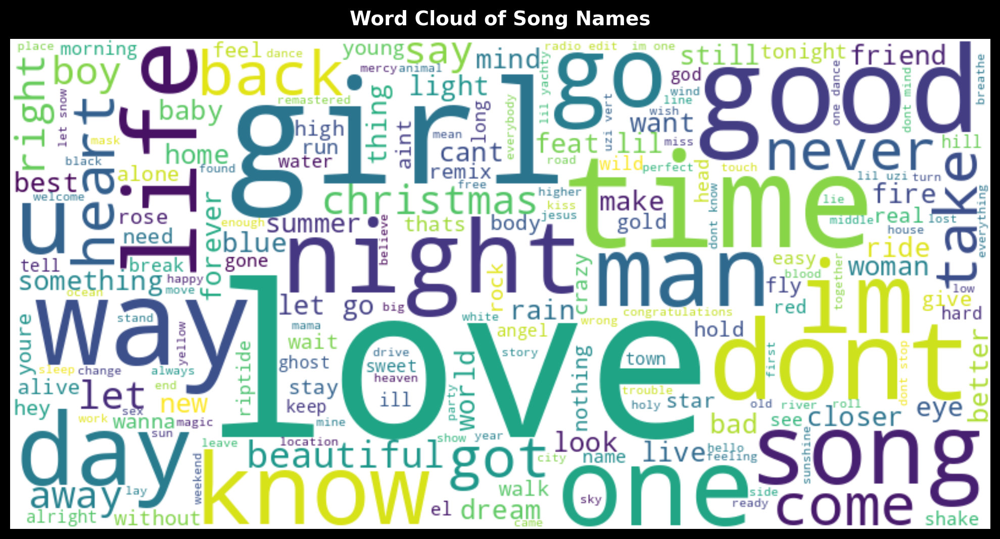

In [33]:
# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(
    " ".join(all_words)
)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Song Names")
plt.show()

## N-Gram Analysis

---


In [34]:
from nltk.util import ngrams


def get_ngrams(text, n):
    n_grams = ngrams(text.split(), n)
    return [" ".join(grams) for grams in n_grams]


df_["bigrams"] = df_["cleaned_music"].apply(lambda x: get_ngrams(x, 2))
bigram_list = [item for sublist in df_["bigrams"].tolist() for item in sublist]
bigram_freq = Counter(bigram_list)
most_common_bigrams = bigram_freq.most_common(20)

display(most_common_bigrams)

[('let go', 48),
 ('feat lil', 47),
 ('let snow', 29),
 ('dont know', 27),
 ('radio edit', 26),
 ('dont stop', 24),
 ('im one', 23),
 ('dont mind', 23),
 ('one dance', 23),
 ('lil yachty', 23),
 ('lil uzi', 22),
 ('uzi vert', 22),
 ('im gonna', 21),
 ('ispy feat', 21),
 ('say name', 21),
 ('trap queen', 20),
 ('bad boujee', 20),
 ('boujee feat', 20),
 ('let love', 20),
 ('young dumb', 20)]

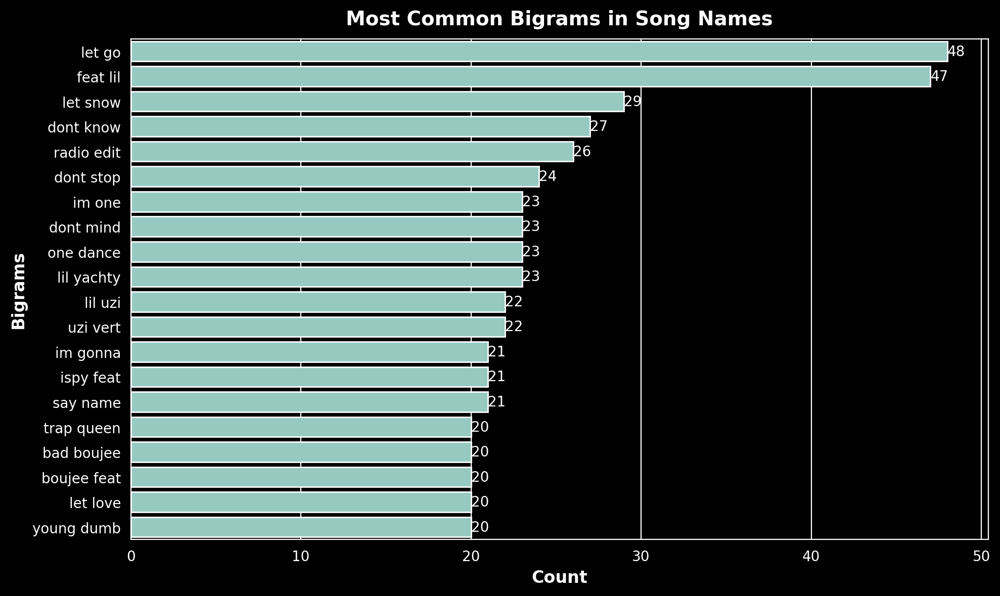

In [35]:
bigrams, counts = zip(*most_common_bigrams)
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=list(counts), y=list(bigrams), ax=ax)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Most Common Bigrams in Song Names")
plt.xlabel("Count")
plt.ylabel("Bigrams")
plt.show()

In [36]:
# Select numeric columns only
df_numeric = df.select_dtypes(include=[np.number])

# Identify outliers using IQR method
Q1 = df_numeric.quantile(0.25)
Q3 = df_numeric.quantile(0.75)
IQR = Q3 - Q1

# Define outlier criteria
outliers = (df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))
print(outliers.sum())

# Remove outliers
df_no_outliers = df_numeric[
    ~((df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))).any(axis=1)
]

user_id              0
age                  0
plays              259
duration           915
acousticness       691
                  ... 
liveness          1049
valence            405
tempo             1600
time_signature    1076
rating              99
Length: 17, dtype: int64


## Statistical Tests

In [37]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit', 'rating'],
      dtype='object')

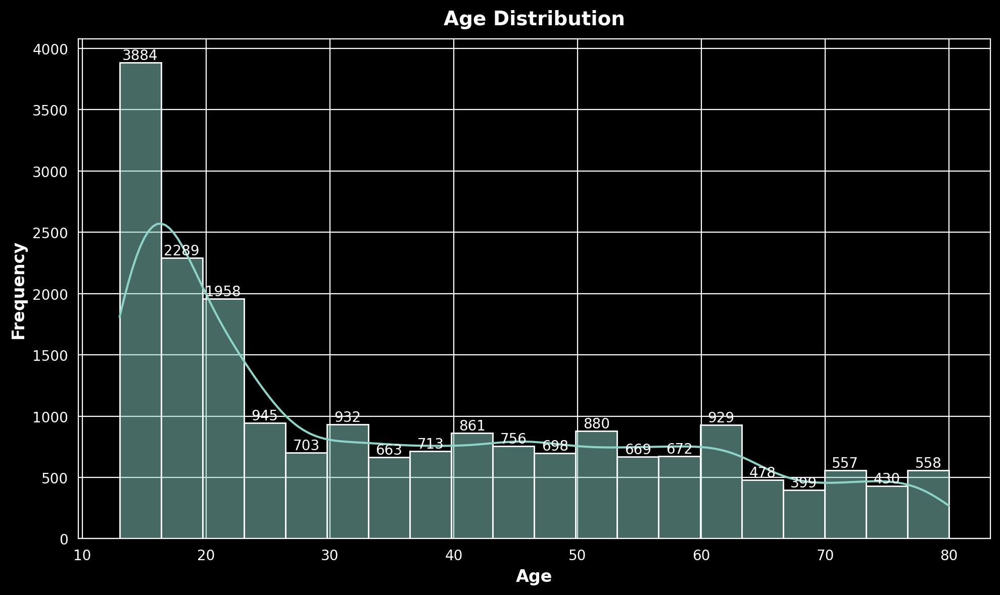

In [38]:
# Histograms for age distribution
fig, ax = plt.subplots(figsize=(10, 6))
# plt.figure(figsize=(10, 6))
sns.histplot(df["age"], bins=20, kde=True)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.show()

In [39]:
len(df["music"].unique())

9470

In [40]:
df["age_group"] = pd.cut(
    df["age"],
    bins=[0, 26, 42, 58, 77, 100],
    labels=["Gen Z", "Millenials", "Gen X", "Baby Boomers", "Silent Generation"],
)

## Age based preferences

In [41]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit', 'rating', 'age_group'],
      dtype='object')

In [42]:
features = df[
    [
        "age",
        "plays",
        "acousticness",
        "danceability",
        "energy",
        "key",
        "loudness",
        "mode",
        "speechiness",
        "instrumentalness",
        "liveness",
        "valence",
        "tempo",
        "time_signature",
        "explicit",
    ]
]
features.head()

,age,plays,acousticness,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,explicit
0,16,11,0.015100,0.884000,0.346000,8,-8.228000,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,True
1,16,686,0.180850,0.577500,0.497500,1,-7.879000,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,False
2,17,136,0.363482,0.568667,0.644000,0,-7.344833,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,False
3,44,230,0.676000,0.843000,0.419000,1,-7.606000,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,False
4,44,391,0.359471,0.518229,0.544046,0,-9.894632,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,False


In [43]:
scaler = MinMaxScaler()
features_scaled = scaler.fit_transform(features)
features_scaled = pd.DataFrame(features_scaled, columns=features.columns)
features_scaled.head()

,age,plays,acousticness,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,explicit
0,0.044776,0.003332,0.015174,0.914798,0.344059,0.727273,0.754382,0.0,0.367925,0.000007,0.078873,0.383282,0.353732,0.8,1.0
1,0.044776,0.228257,0.181758,0.597620,0.496475,0.090909,0.763286,1.0,0.033753,0.000000,0.279149,0.420999,0.480457,0.8,0.0
2,0.059701,0.044985,0.365307,0.588479,0.643860,0.000000,0.776915,1.0,0.093711,0.044273,0.267616,0.412012,0.569861,0.8,0.0
3,0.462687,0.076308,0.679397,0.872370,0.417501,0.090909,0.770251,1.0,0.175052,0.000000,0.088511,0.407747,0.515316,0.8,0.0
4,0.462687,0.129957,0.361276,0.536284,0.543302,0.000000,0.711860,1.0,0.082638,0.240088,0.173485,0.388191,0.568154,0.8,0.0


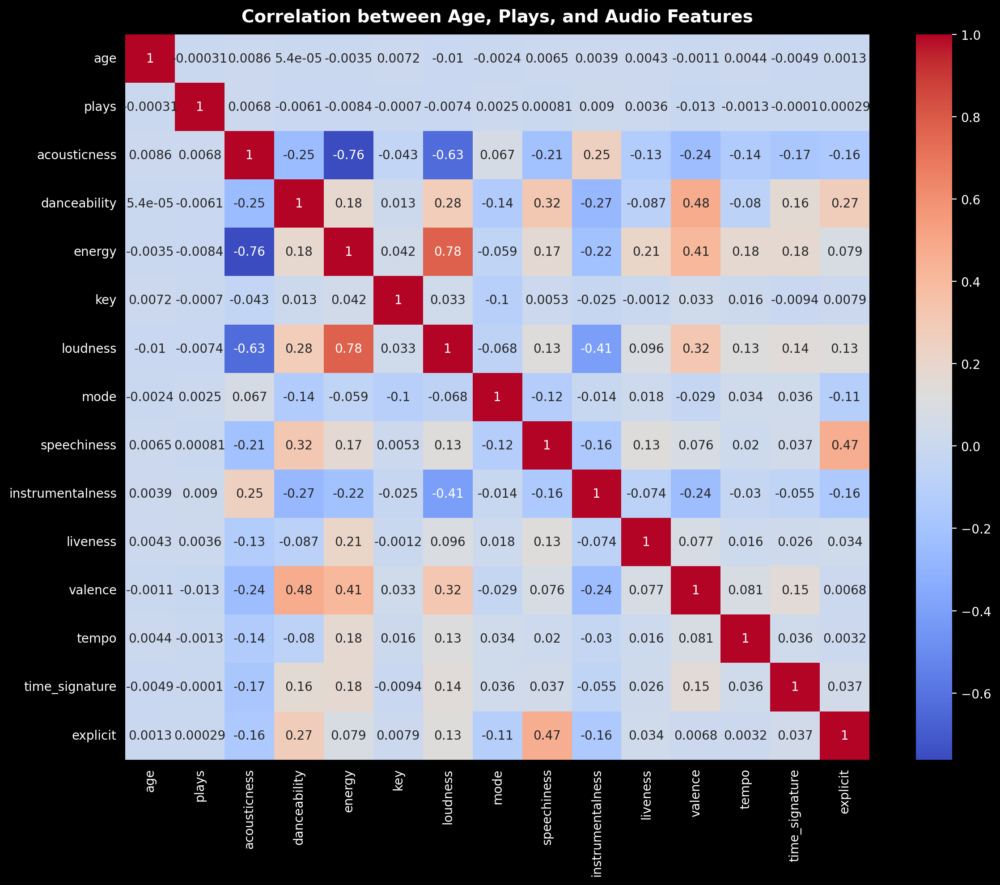

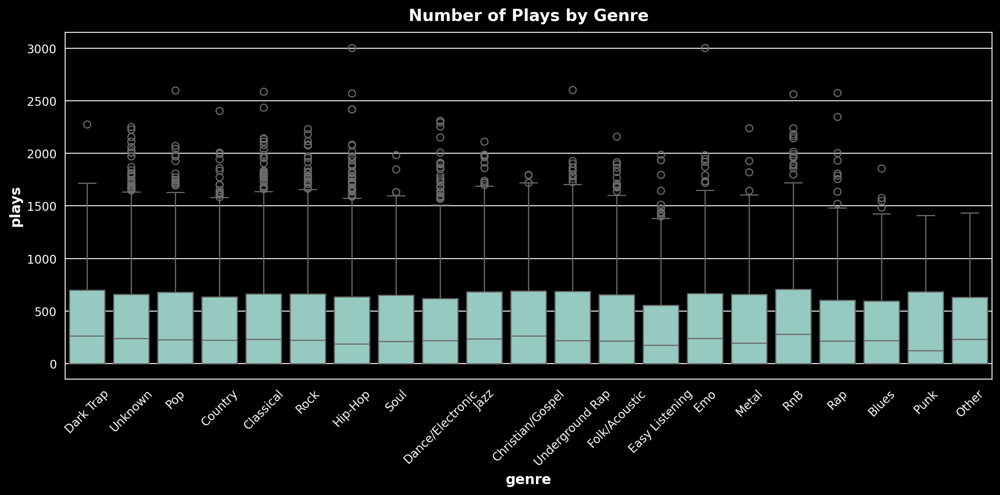

In [44]:
# Correlation between age, plays, and audio features
# audio_features = ['acousticness',
#        'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
#        'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
#        'release_date', 'explicit']
correlation_matrix = features_scaled.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation between Age, Plays, and Audio Features")
plt.show()

# Age vs Plays for different genres
plt.figure(figsize=(12, 6))
sns.boxplot(x="genre", y="plays", data=df)
plt.title("Number of Plays by Genre")
plt.xticks(rotation=45)
plt.show()

## Gender-based preferences

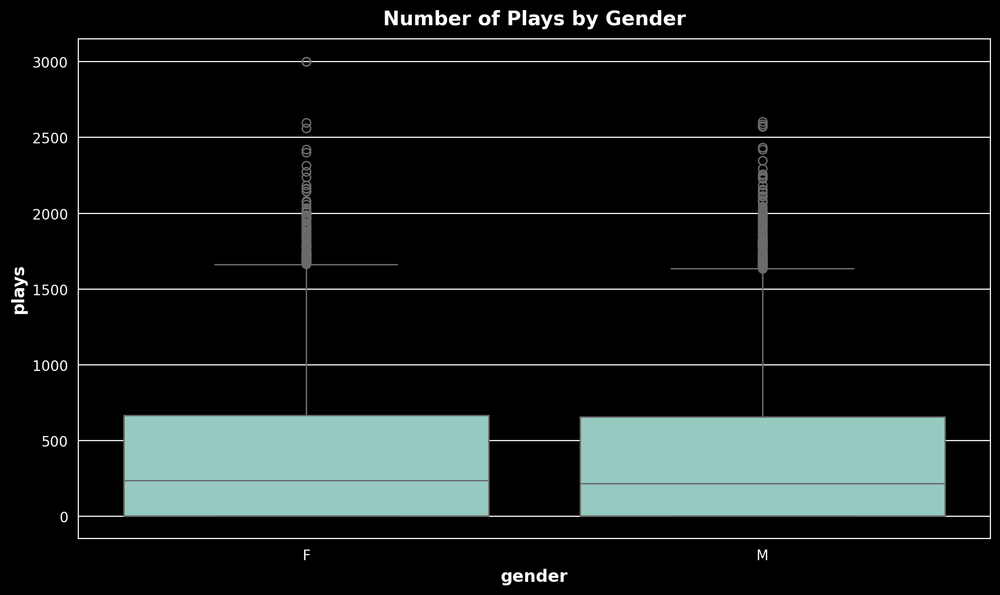

Plays by Gender t-test:
t-statistic = -1.057148120714328
p-value = 0.29045677890324295


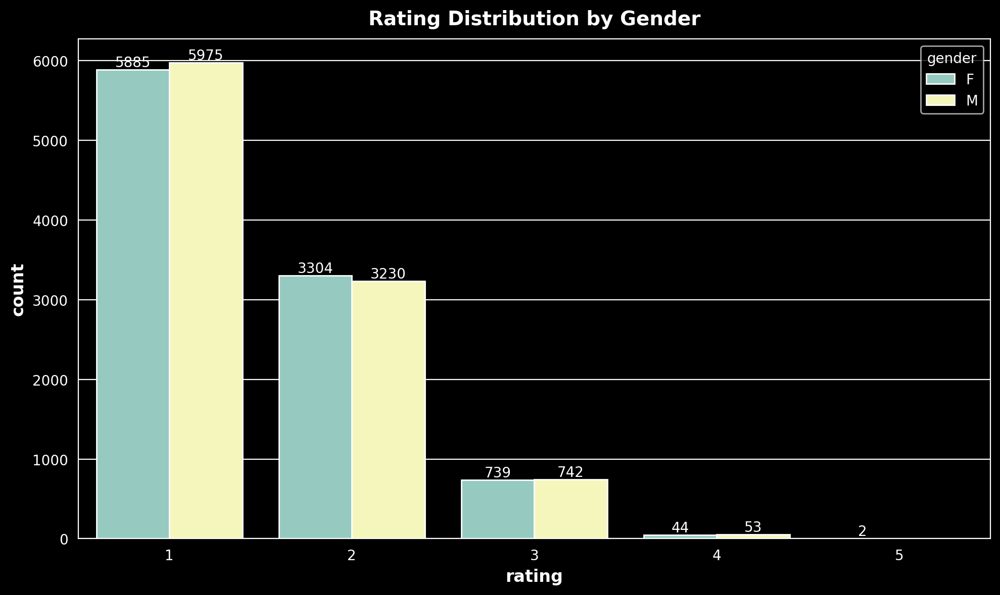

In [45]:
# Gender vs Plays
from matplotlib.pyplot import bar_label


plt.figure(figsize=(10, 6))
sns.boxplot(x="gender", y="plays", data=df)
plt.title("Number of Plays by Gender")
plt.show()

t_stat, p_value = stats.ttest_ind(
    df[df["gender"] == "M"]["plays"], df[df["gender"] == "F"]["plays"]
)
print(
    f"Plays by Gender t-test:\n{'='*60}\nt-statistic = {t_stat}\n{'='*60}\np-value = {p_value}"
)

# Gender vs Rating
fig, ax = plt.subplots(figsize=(10, 6))
# plt.figure(figsize=(10, 6))
sns.countplot(x="rating", hue="gender", data=df)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Rating Distribution by Gender")
plt.show()

## Age and Explicit Content

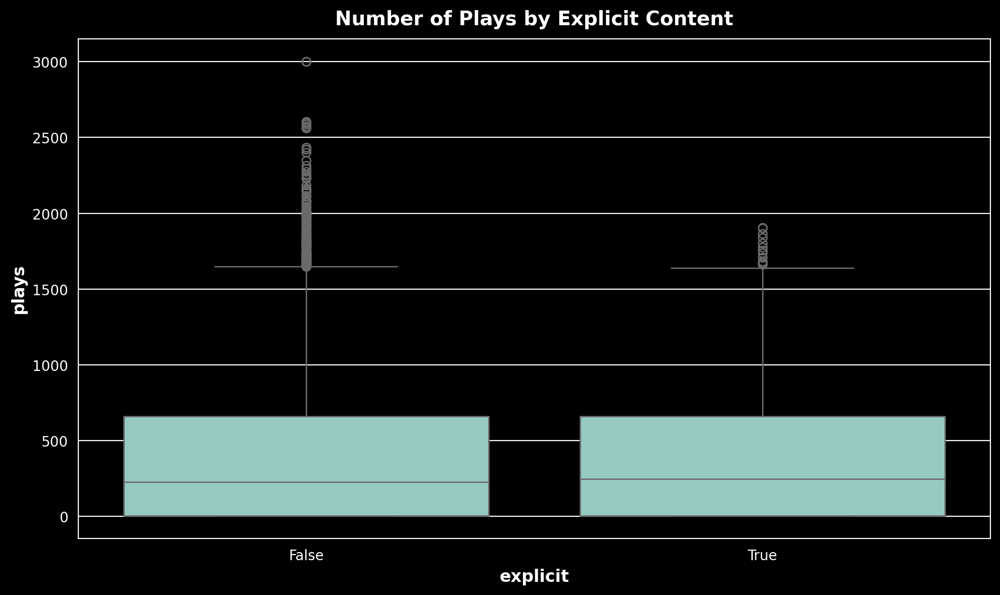

Chi-square statistic: 4.774535222086405
p-value: 0.31122348328526456


In [46]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="explicit", y="plays", data=df)
plt.title("Number of Plays by Explicit Content")
plt.show()

# Chi-square test for age groups and explicit content
age_bins = pd.cut(df["age"], bins=5)
contingency_table = pd.crosstab(age_bins, df["explicit"])
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}\n{'='*40}\np-value: {p_value}")

### Interpretations

1. Age-based preferences (Images 1 and 2):

Image 1 shows the number of plays by genre. There's considerable variation in popularity across genres, with some (like Pop, Country, and Classical) having higher median plays and larger ranges. This suggests that age groups may have different genre preferences.

Image 2 displays correlations between age, plays, and audio features. Notably:
- There's very little correlation between age and number of plays (-0.00031), suggesting age doesn't strongly influence how much someone listens to music.
- Age has weak correlations with audio features, the strongest being with loudness (-0.01).
- The strongest correlations are between audio features themselves, like energy and loudness (0.78), or acousticness and energy (-0.76).

2. Gender-based preferences (Images 3 and 4, plus t-test results):

Image 3 shows the distribution of plays by gender. The box plots look very similar, suggesting little difference in listening habits between genders.

Image 4 displays the rating distribution by gender, which also appears very similar across genders.

The t-test results confirm these observations:
- t-statistic: -1.057148120714328
- p-value: 0.29045677890324295

The high p-value (0.29 > 0.05) indicates that there's no statistically significant difference in the number of plays between genders.

3. Explicit content (Image 5 and Chi-square test results):

Image 5 shows the distribution of plays for explicit and non-explicit content. The distributions look similar, suggesting that the presence of explicit content doesn't strongly influence the number of plays.

The Chi-square test results support this observation:
- Chi-square statistic: 4.774535222086405
- p-value: 0.31122348328526456

The high p-value (0.31 > 0.05) indicates no statistically significant relationship between explicit content and the number of plays.

Interpretation summary:
1. Genre seems to have the strongest influence on the number of plays, suggesting it's an important factor in music preferences.
2. Age doesn't strongly correlate with plays or audio features, indicating that age-based recommendations might not be very effective.
3. Gender doesn't significantly impact listening habits or ratings, suggesting that gender-based recommendations may not be necessary.
4. The presence of explicit content doesn't significantly affect the number of plays.
5. Audio features have strong correlations with each other, which could be useful for content-based filtering in your recommender system.

For your music recommender system, these results suggest that focusing on genre preferences and audio features might be more effective than relying heavily on demographic factors like age or gender. However, individual user behavior (collaborative filtering) and content-based approaches using audio features are likely to be your most powerful tools.

## Genre and Audio Features

In [47]:
plt.figure(figsize=(15, 12))
for i, feature in enumerate(audio_features + ["plays"], 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x="genre", y=feature, data=df)
    plt.title(f"{feature} by Genre")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

NameError: name 'audio_features' is not defined

<Figure size 1500x1200 with 0 Axes>

### Interpretations

## Age and Release Date (considering plays)

In [48]:
df.head()

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit,rating,age_group
0,83811,16,F,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,3.67,2fQrGHiQOvpL9UgPvtYy6G,...,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,2017-09-23,True,1,Gen Z
1,83811,16,F,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",Unknown,686,4.44,2ihCaVdNZmnHZWt0fvAM7B,...,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,2013-04-12,False,2,Gen Z
2,13397,17,M,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",Unknown,136,2.83,46jLy47W8rkf8rEX04gMKB,...,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,2009-02-03,False,1,Gen Z
3,70645,44,M,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,5.14,5oVlbbiKGdGeZkWCFy0mqk,...,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,2017-01-01,False,1,Gen X
4,70645,44,M,Dreams,Campsite Dream,None,Country,391,3.20,1SNoSoQ3JZldOhzBY9gw0n,...,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,1974,False,2,Gen X


In [60]:
def extract_year(x):
    try:
        return pd.to_datetime(x).year
    except ValueError:
        return int(x)


df["release_year"] = df["release_date"].apply(extract_year)

In [61]:
import pandas as pd
import numpy as np


def convert_dates_with_default(df, column_name):
    # Attempt to convert the column to datetime, invalid dates become NaT
    df[column_name] = pd.to_datetime(df[column_name], format="%Y", errors="coerce")

    # Replace NaT with the default date, here choosing January 1st, 2007
    default_date = pd.Timestamp("2007-01-01")
    df[column_name] = df[column_name].fillna(default_date)

    return df


# Example usage
# Assuming df is your DataFrame and 'release_year' is the column with dates
df = convert_dates_with_default(df, "release_date")

In [62]:
df["release_date"].isnull().sum()

0

In [63]:
# df["release_year"][df["release_year"] == 0] = df["release_year"].

In [64]:
df.iloc[8045]["release_date"]

Timestamp('2007-01-01 00:00:00')

In [65]:
df.iloc[10979]

user_id                       15783
age                              77
gender                            F
music                      I Wonder
artist_name              Kanye West
                       ...         
release_date    2007-01-01 00:00:00
explicit                      False
rating                            1
age_group              Baby Boomers
release_year                   2007
Name: 10979, Length: 28, dtype: object

In [66]:
# Set music =='I Wonder' with release_year of 2007 for all cases

In [67]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit', 'rating', 'age_group', 'release_year'],
      dtype='object')

In [68]:
# df["release_year"].unique()

In [69]:
df["release_year"].isna().sum()

0

In [70]:
df["release_year"] = pd.to_datetime(df["release_year"], format="%Y")

In [71]:
df["release_year"]

0       2007-01-01
1       2007-01-01
2       2007-01-01
3       2007-01-01
4       1974-01-01
           ...    
19969   1993-01-01
19970   2007-01-01
19971   2007-01-01
19972   2007-01-01
19973   2007-01-01
Name: release_year, Length: 19974, dtype: datetime64[ns]

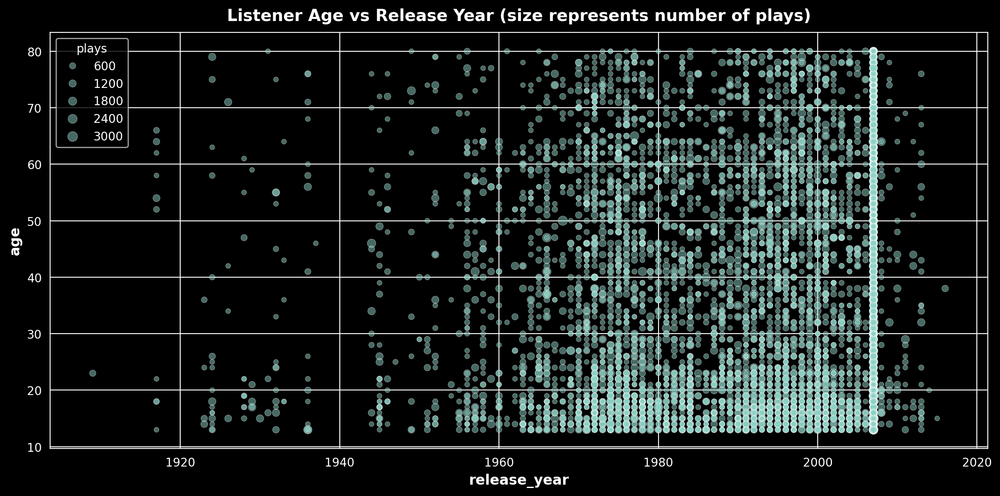

Correlation between age and release year: 0.002400


In [72]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x="release_year", y="age", size="plays", data=df, alpha=0.5)
plt.title("Listener Age vs Release Year (size represents number of plays)")
plt.show()

correlation = df["age"].corr(df["release_year"])
print(f"Correlation between age and release year: {correlation:.6f}")

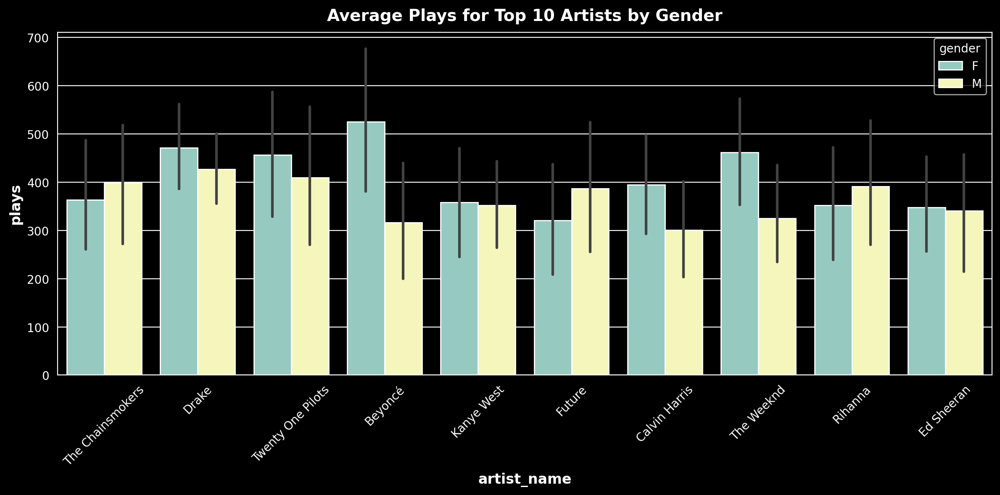

In [73]:
## Gender and artist preferences (considering plays):
top_artists = df.groupby("artist_name")["plays"].sum().nlargest(10).index
artist_gender_data = df[df["artist_name"].isin(top_artists)]

plt.figure(figsize=(12, 6))
sns.barplot(
    x="artist_name", y="plays", hue="gender", data=artist_gender_data, estimator=np.mean
)
plt.title("Average Plays for Top 10 Artists by Gender")
plt.xticks(rotation=45)
plt.show()

## Age and Tempo preferences (considering plays)

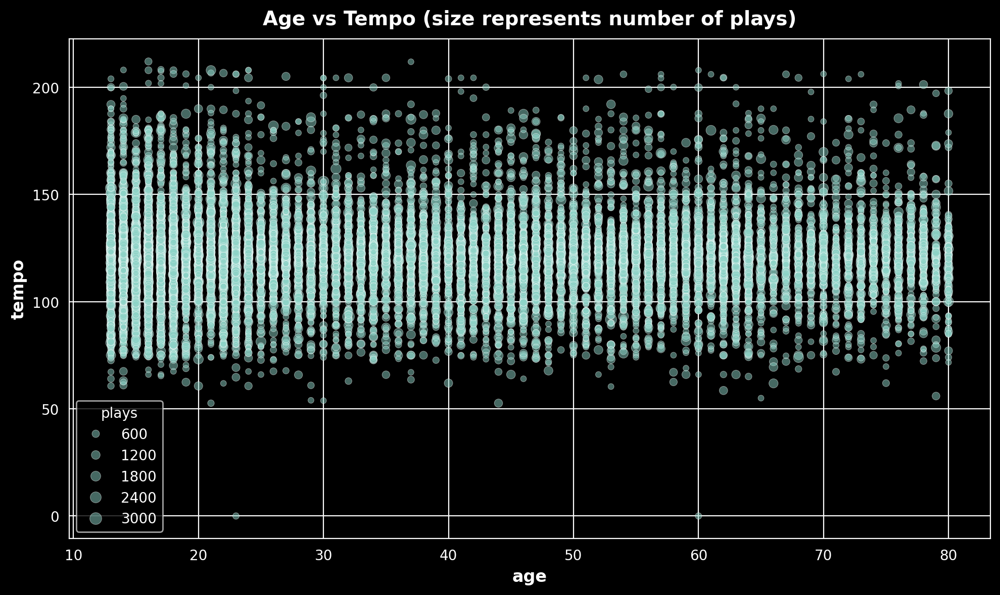

Correlation between age and tempo: 0.004


In [74]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="age", y="tempo", size="plays", data=df, alpha=0.5)
plt.title("Age vs Tempo (size represents number of plays)")
plt.show()

correlation = df["age"].corr(df["tempo"])
print(f"Correlation between age and tempo: {correlation:.3f}")

## Gender and danceability

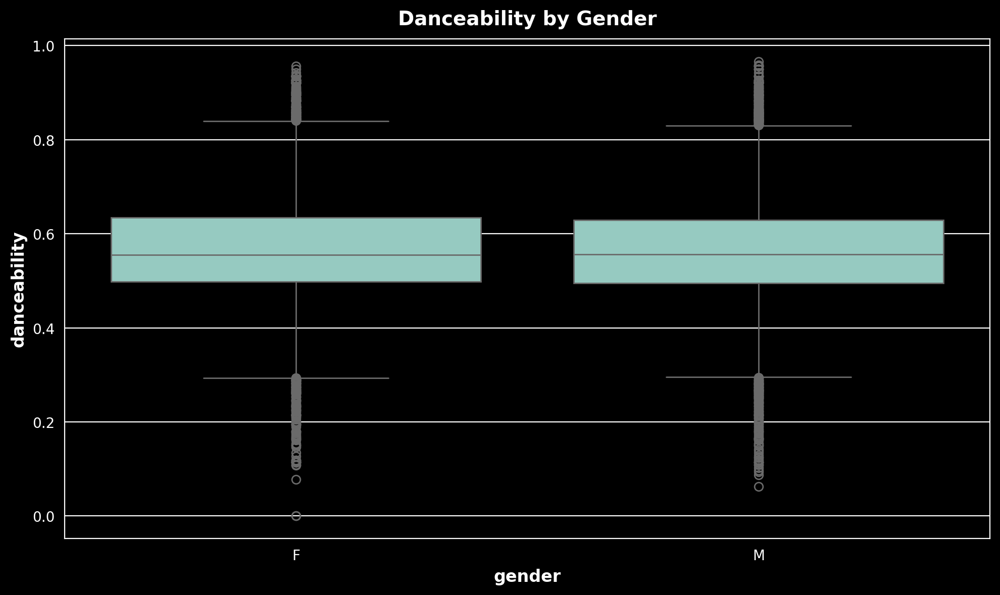

Danceability t-test: t-statistic = -1.419
p-value = 0.156
Correlation between danceability and plays: -0.006


In [75]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="gender", y="danceability", data=df)
plt.title("Danceability by Gender")
plt.show()

t_stat, p_value = stats.ttest_ind(
    df[df["gender"] == "M"]["danceability"], df[df["gender"] == "F"]["danceability"]
)
print(
    f"Danceability t-test: t-statistic = {t_stat:.3f}\n{'='*60}\np-value = {p_value:.3f}"
)

# Correlation between danceability and plays
correlation = df["danceability"].corr(df["plays"])
print(f"Correlation between danceability and plays: {correlation:.3f}")

In [76]:
from scipy.stats import chi2_contingency, f_oneway, ttest_ind

# Chi-Square Test for Independence between gender and genre
contingency_table = pd.crosstab(df["gender"], df["genre"])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f'Chi-Square Test:\np-value = {p:.3f}\n{"="*60}\n')

# ANOVA to test differences in danceability across age groups
age_groups = df["age"].unique()
danceability_data = [
    df[df["age"] == age_group]["danceability"] for age_group in age_groups
]
f_stat, p_val = f_oneway(*danceability_data)
print(f"ANOVA:\np-value = {p_val:.3f}")

Chi-Square Test:
p-value = 0.291

ANOVA:
p-value = 0.940


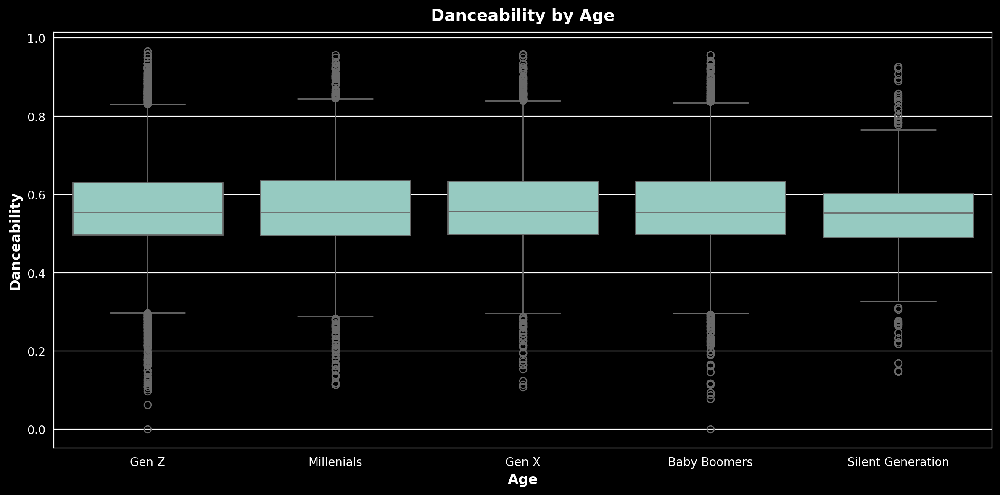

In [77]:
# Visualize danceability across different age groups
plt.figure(figsize=(12, 6))
sns.boxplot(x="age_group", y="danceability", data=df)
plt.title("Danceability by Age")
plt.xlabel("Age")
plt.ylabel("Danceability")
plt.show()

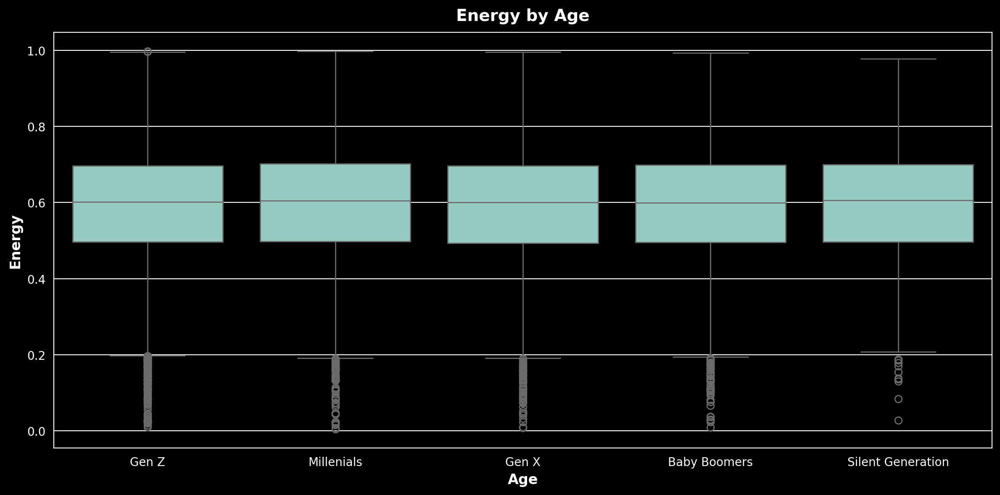

In [78]:
# Visualize energy across different age groups
plt.figure(figsize=(12, 6))
sns.boxplot(x="age_group", y="energy", data=df)
plt.title("Energy by Age")
plt.xlabel("Age")
plt.ylabel("Energy")
plt.show()

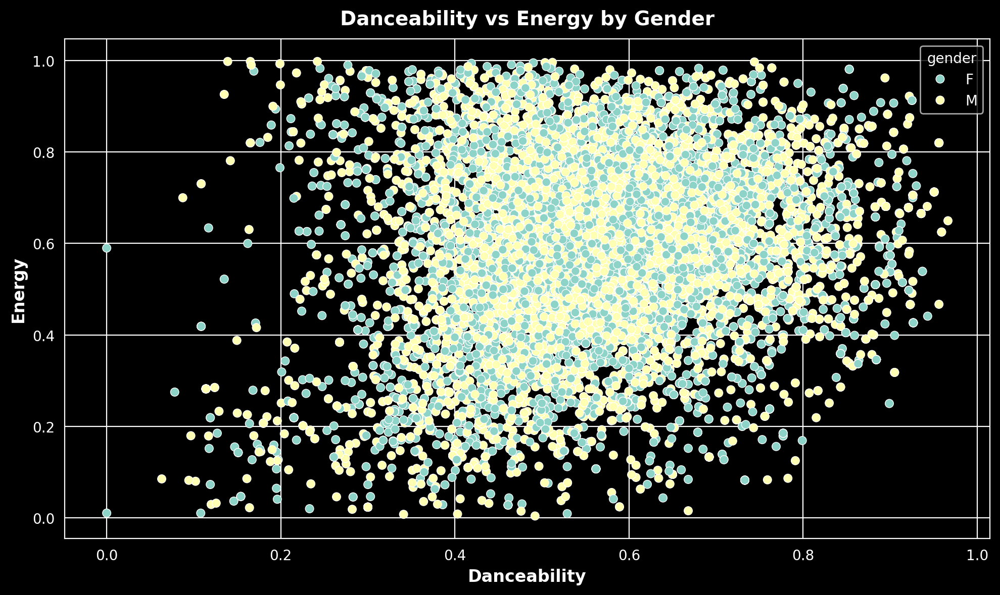

In [79]:
# Scatter plot to explore relationships between danceability and energy
plt.figure(figsize=(10, 6))
sns.scatterplot(x="danceability", y="energy", hue="gender", data=df)
plt.title("Danceability vs Energy by Gender")
plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.show()

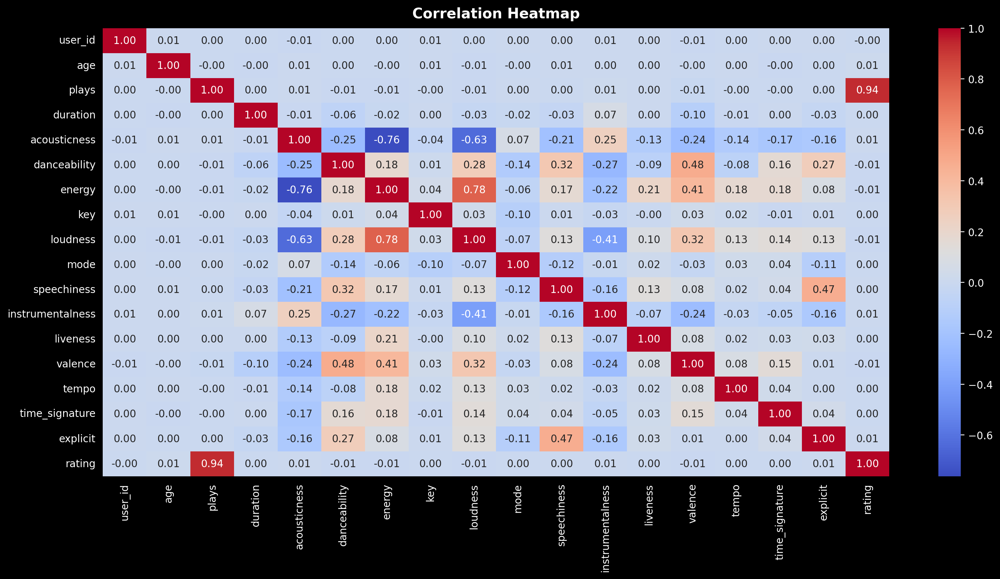

In [80]:
# Plot a correlation heatmap
plt.figure(figsize=(15, 8))
correlation_matrix = df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()  # plots the correlation heatmap

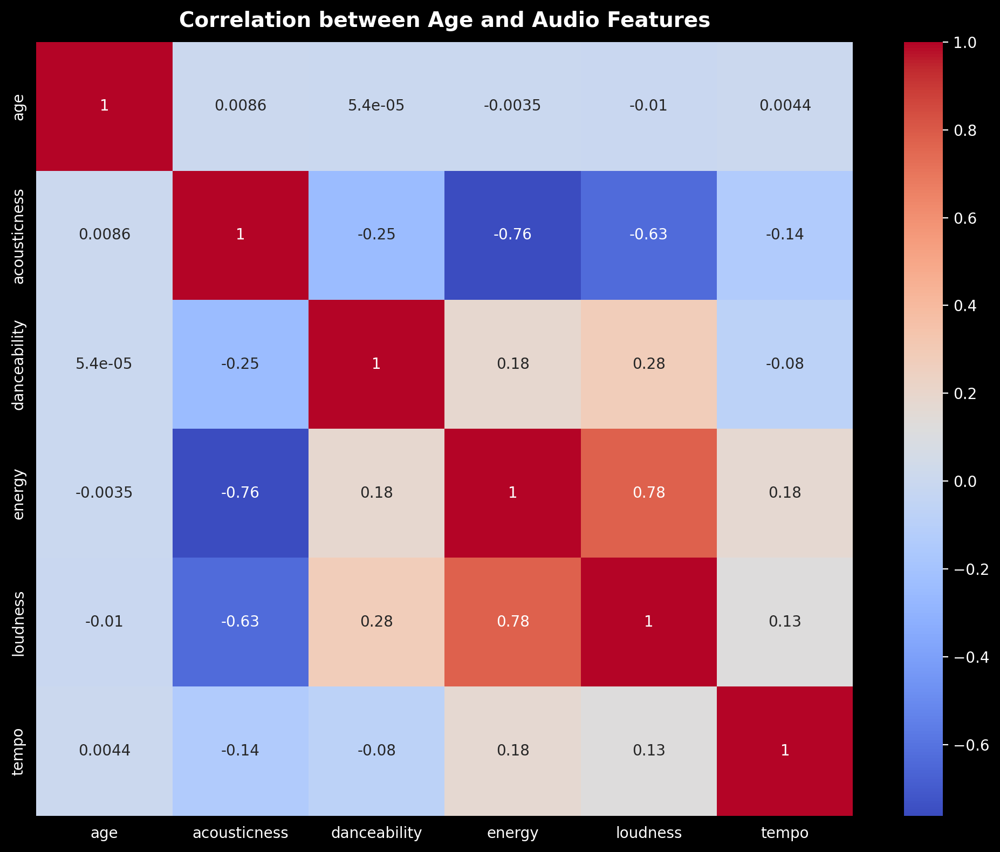

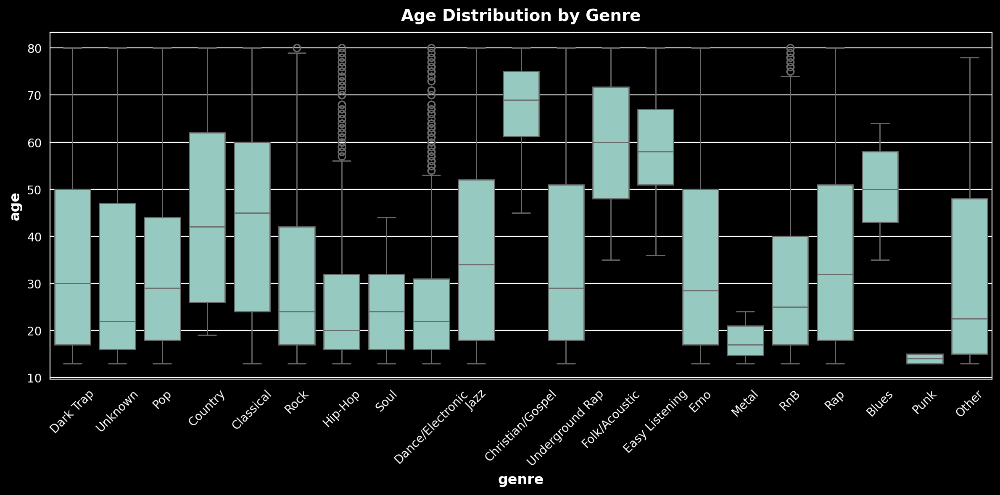

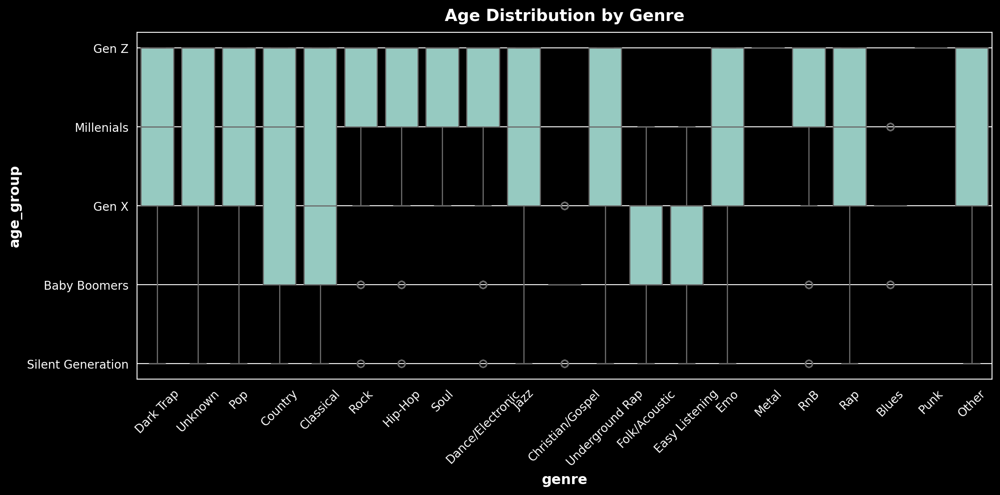

In [81]:
# Correlation between age and audio features
audio_features = ["acousticness", "danceability", "energy", "loudness", "tempo"]
correlation_matrix = df[["age"] + audio_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation between Age and Audio Features")
plt.show()

# Age vs Genre preferences
plt.figure(figsize=(12, 6))
sns.boxplot(x="genre", y="age", data=df)
plt.title("Age Distribution by Genre")
plt.xticks(rotation=45)
plt.show()

# Age group vs Genre preferences
plt.figure(figsize=(12, 6))
sns.boxplot(x="genre", y="age_group", data=df)
plt.title("Age Distribution by Genre")
plt.xticks(rotation=45)
plt.show()

## Gender-based preferences

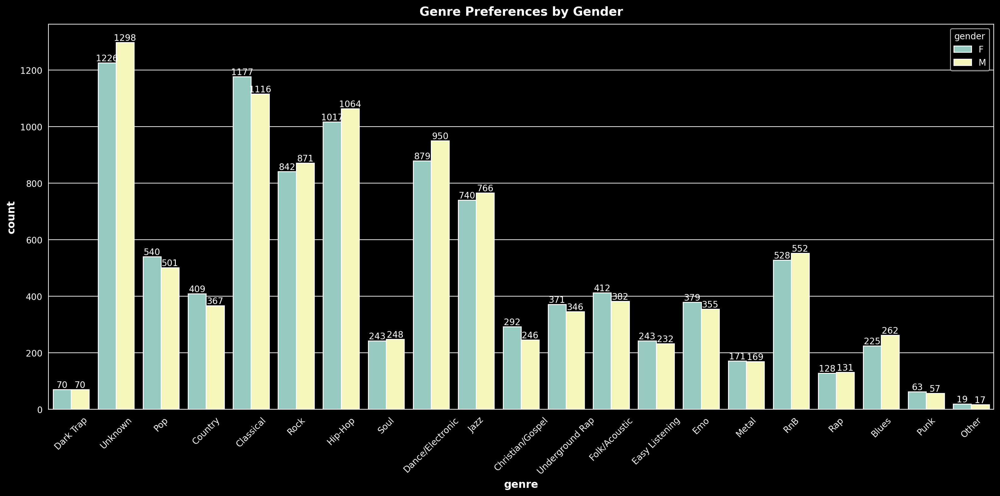

acousticness:
t-statistic = 0.960
p-value = 0.337
danceability:
t-statistic = -1.419
p-value = 0.156
energy:
t-statistic = -0.353
p-value = 0.724
loudness:
t-statistic = -0.467
p-value = 0.640
tempo:
t-statistic = -0.357
p-value = 0.721


In [82]:
# Gender vs Genre preferences
fig, ax = plt.subplots(figsize=(16, 8))
sns.countplot(x="genre", hue="gender", data=df, ax=ax)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Genre Preferences by Gender")
plt.xticks(rotation=45)
plt.show()

# Gender vs Audio Features
for feature in audio_features:
    t_stat, p_value = stats.ttest_ind(
        df[df["gender"] == "M"][feature], df[df["gender"] == "F"][feature]
    )
    print(f"{feature}:\nt-statistic = {t_stat:.3f}\np-value = {p_value:.3f}\n{'='* 60}")

## Age and Explicit Content

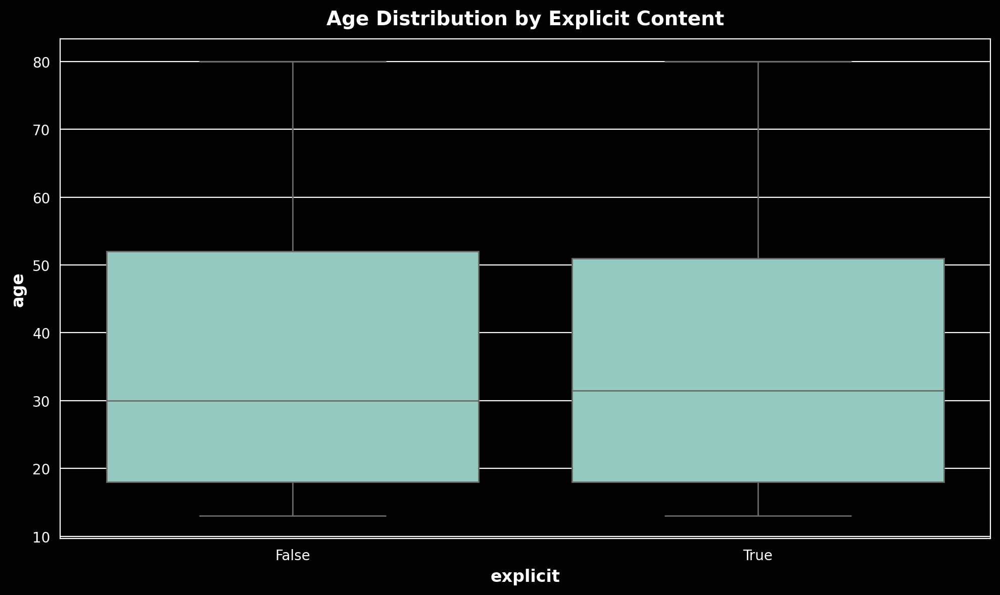

Chi-square statistic: 4.774535222086405
p-value: 0.311


In [83]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="explicit", y="age", data=df)
plt.title("Age Distribution by Explicit Content")
plt.show()

# Chi-square test
contingency_table = pd.crosstab(pd.cut(df["age"], bins=5), df["explicit"])
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}\np-value: {p_value:.3f}")

## Genre and audio features

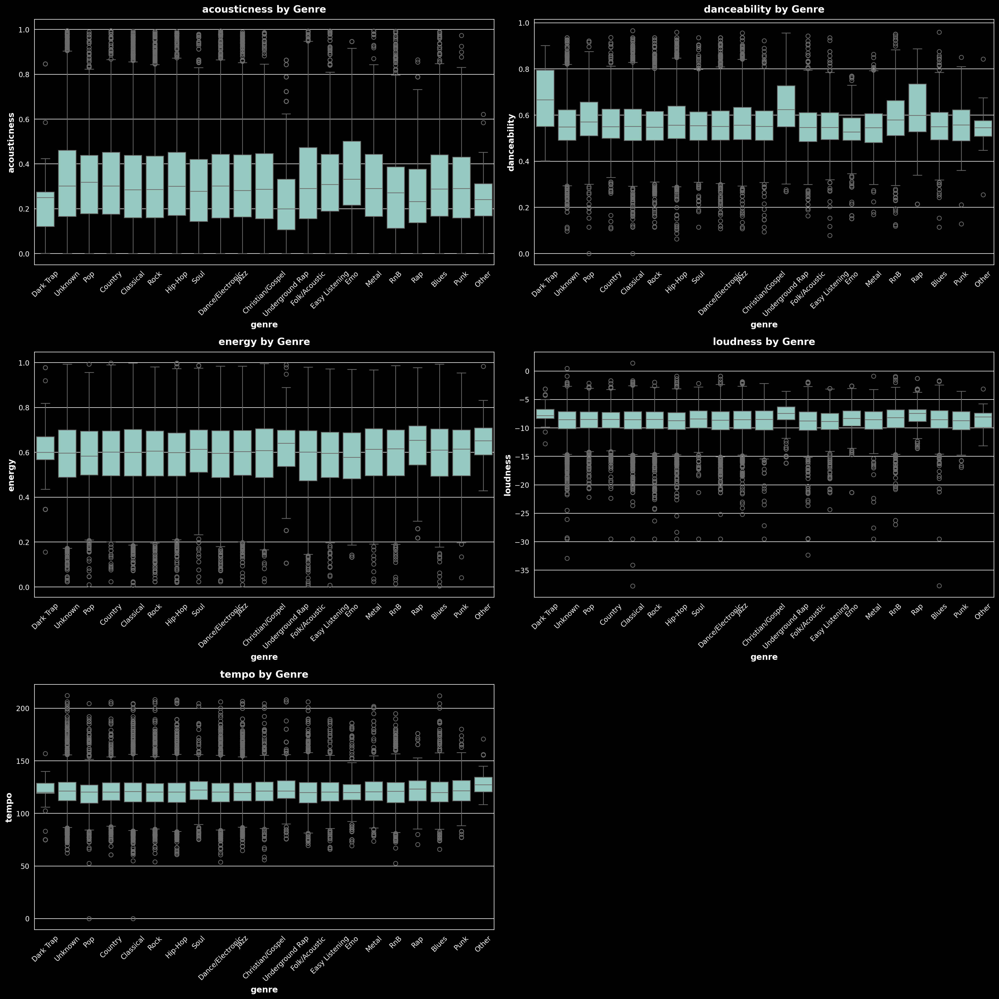

In [84]:
plt.figure(figsize=(20, 20))
for i, feature in enumerate(audio_features, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x="genre", y=feature, data=df)
    plt.title(f"{feature} by Genre")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Fix inconsistencies with Date column

In [85]:
df["release_date"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 19974 entries, 0 to 19973
Series name: release_date
Non-Null Count  Dtype         
--------------  -----         
19974 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 156.2 KB


In [86]:
df["release_date"].isnull().sum()

0

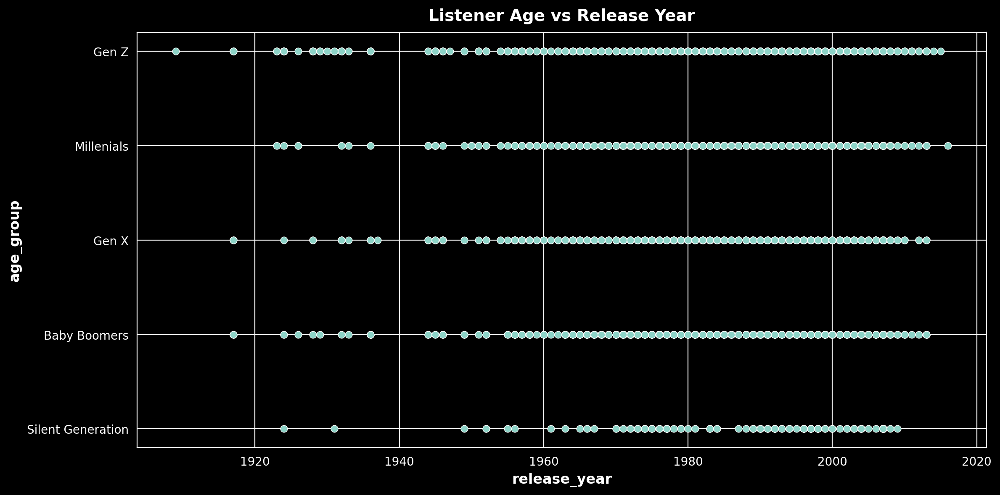

Correlation between age and release year: 0.002


In [87]:
# df["release_year"] = df["release_date"].dt.year
plt.figure(figsize=(12, 6))
sns.scatterplot(x="release_year", y="age_group", data=df)
plt.title("Listener Age vs Release Year")
plt.show()

correlation = df["age"].corr(df["release_year"])
print(f"Correlation between age and release year: {correlation:.3f}")

## Gender and artist preferences

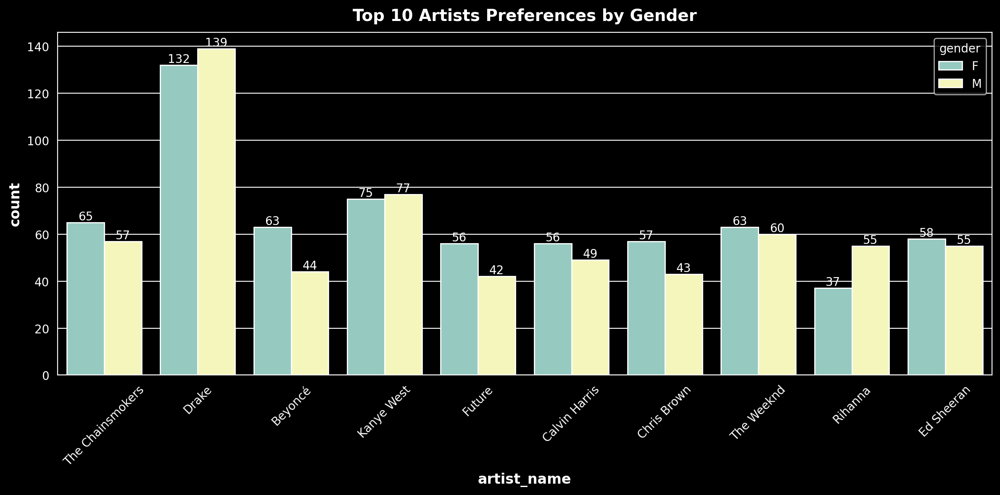

In [88]:
top_artists = df["artist_name"].value_counts().head(10).index
artist_gender_data = df[df["artist_name"].isin(top_artists)]

fig, ax = plt.subplots(figsize=(12, 6))
sns.countplot(x="artist_name", hue="gender", data=artist_gender_data)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Top 10 Artists Preferences by Gender")
plt.xticks(rotation=45)
plt.show()

## Age and tempo preferences

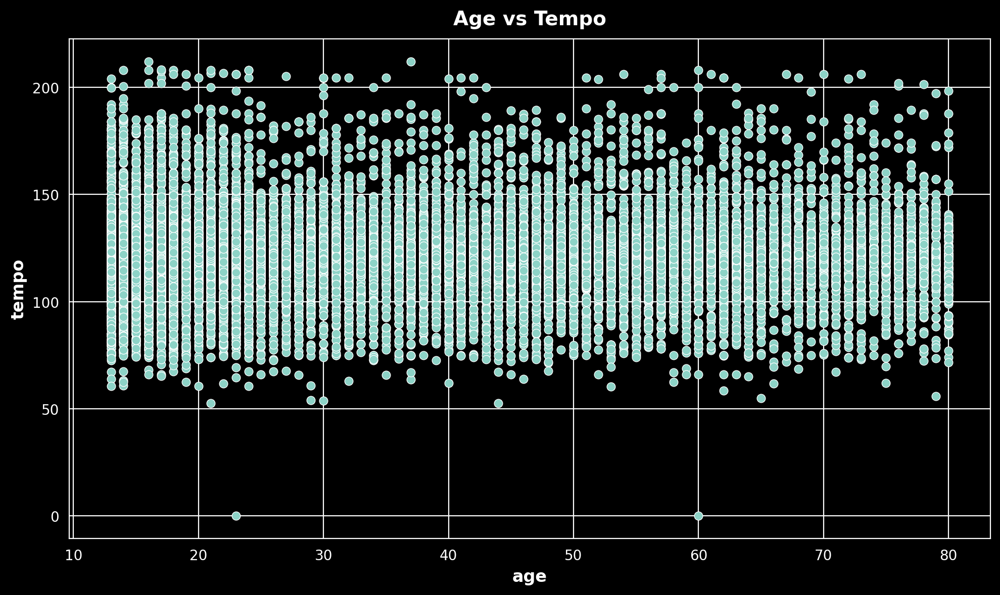

Correlation between age and tempo: 0.004


In [89]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="age", y="tempo", data=df)
plt.title("Age vs Tempo")
plt.show()

correlation = df["age"].corr(df["tempo"])
print(f"Correlation between age and tempo: {correlation:.3f}")

## Gender and Danceability

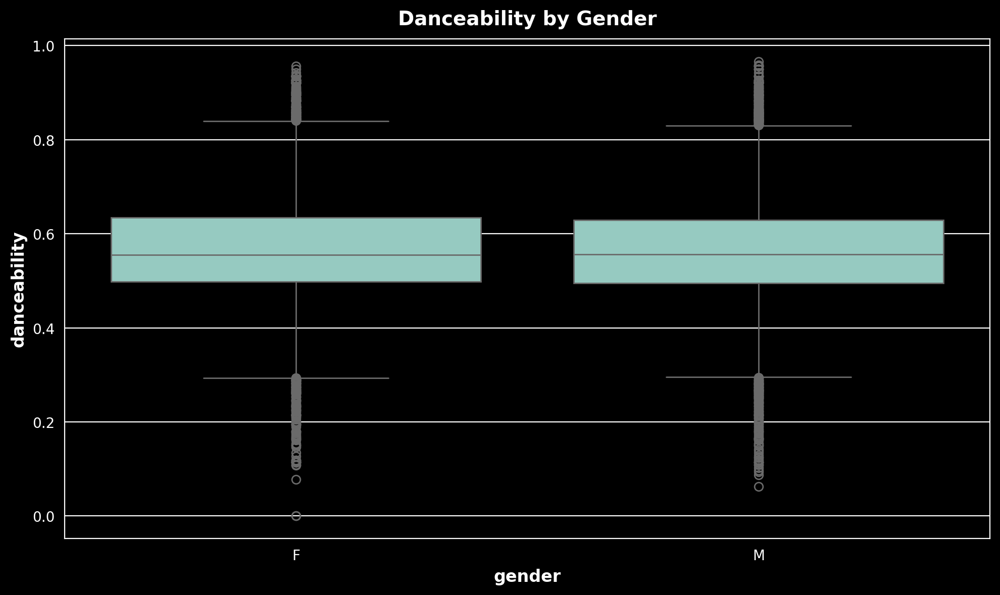

Danceability t-test:
t-statistic = -1.4190306678236608
p-value = 0.15590568087433074


In [90]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="gender", y="danceability", data=df)
plt.title("Danceability by Gender")
plt.show()

t_stat, p_value = stats.ttest_ind(
    df[df["gender"] == "M"]["danceability"], df[df["gender"] == "F"]["danceability"]
)
print(f"Danceability t-test:\nt-statistic = {t_stat}\np-value = {p_value}")

# Machine Learning Prediction of User Preferences

In [91]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit', 'rating', 'age_group', 'release_year'],
      dtype='object')

In [92]:
df.drop(["release_date", "release_year"], axis=1, inplace=True)

# Tensorflow recommenders

In [98]:
import tensorflow as tf
import tensorflow_recommenders as tfrs

# import tensorflow_recommenders_addons as tfra
TF_ENABLE_ONEDNN_OPTS = 0

In [99]:
# Split the data
# data = df.copy()

In [100]:
# Ensure all columns have consistent df types
df["user_id"] = df["user_id"].astype(str)
df["music_id"] = df["music_id"].astype(str)
df["music"] = df["music"].astype(str)
df["age"] = df["age"].astype(int)
df["gender"] = df["gender"].astype(str)
df["age_group"] = df["age_group"].astype(str)
df["plays"] = df["plays"].astype(int)
df["duration"] = df["duration"].astype(float)
df["acousticness"] = df["acousticness"].astype(float)
df["danceability"] = df["danceability"].astype(float)
df["energy"] = df["energy"].astype(float)
df["key"] = df["key"].astype(float)
df["loudness"] = df["loudness"].astype(float)
df["mode"] = df["mode"].astype(float)
df["speechiness"] = df["speechiness"].astype(float)
df["instrumentalness"] = df["instrumentalness"].astype(float)
df["liveness"] = df["liveness"].astype(float)
df["valence"] = df["valence"].astype(float)
df["tempo"] = df["tempo"].astype(float)
df["time_signature"] = df["time_signature"].astype(float)
df["explicit"] = df["explicit"].astype(float)
df["rating"] = df["rating"].astype(float)
# df["release_year"] = df["release_year"].astype(int)
# df['release_year'] = df['release_year'].astype(int)

In [101]:
def df_to_dataset(dataframe, shuffle=True):
    dataframe = dataframe.copy()
    # labels = dataframe.pop('target').astype('float64')
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe)))
    # if shuffle:
    # ds = ds.shuffle(buffer_size=len(dataframe))
    # ds = ds.batch(batch_size)
    return ds


# Convert DataFrame to TensorFlow dataset
dataset = df_to_dataset(df)

# Set seed for reproducibility
tf.random.set_seed(42)

dataset_size = tf.data.experimental.cardinality(dataset)
print(f"Estimated dataset size: {dataset_size.numpy()}")


# Shuffle the dataset with a buffer size of 1000
shuffled_dataset = dataset.shuffle(
    buffer_size=len(df), seed=42, reshuffle_each_iteration=False
)

# Split the shuffled dataset (adjust the split ratio as needed)
train_size = int(0.8 * len(df))
train_dataset = shuffled_dataset.take(train_size)
test_dataset = shuffled_dataset.skip(train_size)
print(
    f"Estimated train size: {train_size}\nEstimated test dataset size: {len(df) - train_size}"
)

# # Print dataset shapes for debugging
# print("Train dataset shapes:")
# for batch in cached_train.take(10):
#   for key, value in batch.items():
#     print(f"{key}: {tf.shape(value)}")

# print("Test dataset shapes:")
# for batch in cached_test.take(10):
#   for key, value in batch.items():
#     print(f"{key}: {tf.shape(value)}")

Estimated dataset size: 313
Estimated train size: 15979
Estimated test dataset size: 3995


In [102]:
for example in test_dataset.take(5):
    pprint.pprint(example)

2024-07-29 22:51:59.764486: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [ ]:
# import tensorflow as tf
# import tensorflow_recommenders as tfrs

# Define embedding dimensions
embedding_dimension = 128

# Extract unique values for lookup layers and ensure no duplicates
unique_user_ids = df["user_id"].astype(str).unique().tolist()
unique_ages = df["age"].unique().tolist()
unique_genders = df["gender"].unique().tolist()
# unique_song_ids = df["music_id"].unique().tolist()
unique_music = df["music"].unique().tolist()
unique_genres = df["genre"].unique().tolist()
unique_artist_names = df["artist_name"].unique().tolist()
unique_age_groups = df["age_group"].unique().tolist()


# Define user model
class UserModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.user_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_user_ids, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_user_ids) + 1, embedding_dimension
                ),
            ]
        )
        self.age_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.IntegerLookup(vocabulary=unique_ages, mask_token=None),
                tf.keras.layers.Embedding(len(unique_ages) + 1, embedding_dimension),
            ]
        )
        self.gender_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_genders, mask_token=None
                ),
                tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),
            ]
        )
        self.age_group_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_age_groups, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_age_groups) + 1, embedding_dimension
                ),
            ]
        )

    def call(self, inputs):
        return tf.concat(
            [
                self.user_embedding(inputs["user_id"]),
                self.age_embedding(inputs["age"]),
                self.gender_embedding(inputs["gender"]),
                self.age_group_embedding(inputs["age_group"]),
            ],
            axis=1,
        )


# Define item model with audio features
class ItemModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.song_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
                tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
            ]
        )
        self.genre_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
                tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),
            ]
        )
        self.artist_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_artist_names, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_artist_names) + 1, embedding_dimension
                ),
            ]
        )
        self.audio_features = tf.keras.layers.Dense(embedding_dimension)

    def call(self, inputs):
        song_embedding = self.song_embedding(inputs["music"])
        genre_embedding = self.genre_embedding(inputs["genre"])
        artist_embedding = self.artist_embedding(inputs["artist_name"])

        # # Ensure all numerical features are float32
        # for col in ["acousticness", "danceability", "energy", "loudness", "speechiness", "instrumentalness", "liveness", "valence", "tempo", "time_signature"]:
        #     inputs[col] = inputs[col].astype(tf.float32)

        # # Convert 'key' and 'mode' to float32
        # inputs["key"] = inputs["key"].astype(tf.float32)
        # inputs["mode"] = inputs["mode"].astype(tf.float32)
        # Check shape of audio features
        audio_features = tf.stack(
            [
                inputs["acousticness"],
                inputs["danceability"],
                inputs["energy"],
                inputs["key"],
                inputs["loudness"],
                inputs["mode"],
                inputs["speechiness"],
                inputs["instrumentalness"],
                inputs["liveness"],
                inputs["valence"],
                inputs["tempo"],
                inputs["time_signature"],
            ],
            axis=1,
        )

        # Print shapes for debugging
        print(f"Audio features shape before Dense layer: {audio_features.shape}")
        # for col in ["acousticness", "danceability", "energy", "loudness", "speechiness", "instrumentalness", "liveness", "valence", "tempo", "time_signature"]:
        #     inputs[col] = inputs[col].astype(tf.float32)

        # # Convert 'key' and 'mode' to float32
        # inputs["key"] = inputs["key"].astype(tf.float32)
        # inputs["mode"] = inputs["mode"].astype(tf.float32)

        audio_features = self.audio_features(audio_features)

        return tf.concat(
            [song_embedding, genre_embedding, artist_embedding, audio_features],
            axis=1,
            # [song_embedding, genre_embedding, artist_embedding], axis=1
        )


# Define the multitask model
class MultitaskModel(tfrs.models.Model):
    def __init__(self, user_model, item_model, candidates):
        super().__init__()
        self.user_model = user_model
        self.item_model = item_model
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(candidates=candidates)
        )
        self.plays_prediction_task = tf.keras.Sequential(
            [tf.keras.layers.Dense(128, activation="relu"), tf.keras.layers.Dense(1)]
        )
        self.plays_loss = tf.keras.losses.MeanSquaredError()

    def enumerate_rows(self, batch):
        if tf.shape(batch)[0] == 0:
            # Handle empty batch (e.g., return default values or skip processing)
            return None

    def call(self, features):
        user_embeddings = self.user_model(features)
        item_embeddings = self.item_model(features)
        return user_embeddings, item_embeddings

    def compute_loss(self, features, training=False):
        user_embeddings, item_embeddings = self(features)
        retrieval_loss = self.retrieval_task(
            user_embeddings, item_embeddings, compute_metrics=not training
        )
        plays_predictions = self.plays_prediction_task(
            tf.concat([user_embeddings, item_embeddings], axis=1)
        )
        plays_loss = self.plays_loss(features["plays"], plays_predictions)
        return retrieval_loss + plays_loss


# Check if candidates are not empty
candidates = train_dataset.map(lambda x: x["music"])
for candidate in candidates.take(1):
    print(f"Candidate sample: {candidate.numpy()}")

# Ensure candidates are correctly mapped
if not list(candidates):
    raise ValueError(
        "Candidates set is empty. Ensure 'music' is correctly mapped from the dataset."
    )

# Instantiate models
user_model = UserModel()
item_model = ItemModel()
model = MultitaskModel(user_model, item_model, candidates)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.01))

# Cache datasets for performance
batch_size = 1024  # Adjust as needed

cached_train = train_dataset.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)
cached_test = test_dataset.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)

# Print dataset shapes for debugging
print("Train dataset shapes:")
for batch in cached_train.take(1):
    for key, value in batch.items():
        print(f"{key}: {tf.shape(value)}")

print("Test dataset shapes:")
for batch in cached_test.take(1):
    for key, value in batch.items():
        print(f"{key}: {tf.shape(value)}")

# Fit the model
try:
    model.fit(cached_train, epochs=10)
except Exception as e:
    print(f"Error during model fitting: {e}")

# Evaluate the model
try:
    model.evaluate(cached_test, return_dict=True)
except Exception as e:
    print(f"Error during model evaluation: {e}")

Candidate sample: [b'Tequila' b'Altes Kamuffel' b'Wish You Were Here' b'A-Punk' b'Morning'
 b'Homegrown' b'Take Me To Church' b'99 Red Balloons'
 b'Young Dumb & Broke' b'Attention' b'1991' b'Evermore' b'Wait'
 b'How Deep Is Your Love' b'Sex Me (Part I) / Sex Me (Part II)' b'Shining'
 b'Mad' b"I'm Into You" b'Holy Grail' b'Jesus Saves' b'Aloha' b'Party Up'
 b'Cecilia' b'Timber' b'Way Down We Go' b'Free to Be Me' b'Like A Virgin'
 b'POWER' b'Poison & Wine' b'505' b'Yuba Diamond'
 b'Para Sempre (feat. Elin Melgarejo)' b'Limbo' b'Notice' b'Irreplaceable'
 b'B.Y.O.B.' b'Whispers In The Dark' b'Goodies' b'Evil Woman' b'Domino'
 b'Awakening' b'Annie' b'Bulls On Parade' b"She's so High" b'Salute'
 b'Bottoms Up' b'Teenage Dream' b'Landslide' b'Hello, My Name Is'
 b'As You Are' b'I Want a Hippopotamus for Christmas (Hippo the Hero)'
 b'Money Longer' b"Ain't Your Mama" b'Spiderwebs' b'Sorry' b'Firework'
 b'Mi Primer Amor' b'My Love (feat. Major Lazer, WizKid, Dua Lipa)'
 b'I Wanna Dance with Some

2024-07-29 19:34:18.463749: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-07-29 19:34:18.778823: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


ValueError: Cannot convert '('c', 'o', 'u', 'n', 't', 'e', 'r')' to a shape. Found invalid entry 'c' of type '<class 'str'>'. 